In [5]:
'''
Link do dataset: https://www.kaggle.com/datasets/rashikrahmanpritom/heart-attack-analysis-prediction-dataset/data
'''

'\nLink do dataset: https://www.kaggle.com/datasets/rashikrahmanpritom/heart-attack-analysis-prediction-dataset/data\n'

In [6]:
# imports
import pandas as pd
import numpy as np

from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split, cross_val_score, RandomizedSearchCV
from scipy.stats import randint

from sklearn.metrics import confusion_matrix, precision_score, ConfusionMatrixDisplay, accuracy_score, recall_score, f1_score

from sklearn.tree import plot_tree
import matplotlib.pyplot as plt

In [10]:
# salvar o dataset
df = pd.read_csv("heart.csv")

# separando entre labels e target
data_values = df.iloc[:, :-1].values
data_labels = df.iloc[:, -1:].values


# normalizando os valores
data = (data_values - np.mean(data_values, axis=0)) / np.std(data_values, axis=0)

# Separando as instâncias em um conjunto de treinamento e um de teste
train_data, test_data, train_labels, test_labels = train_test_split(data, data_labels, test_size=0.25, random_state=42)

In [24]:
# utilizando RandomizedSearch para testar vários possíveis parâmetros para o algoritmo e escolher os melhores
param_dist = {'n_estimators': range(10, 100),
              'criterion': ['gini', 'entropy', 'log_loss'],
              'max_features': ['sqrt', 'log2'],
              'max_depth': range(1, 20)
            }

rf = RandomForestClassifier()
rand_search = RandomizedSearchCV(rf, param_distributions=param_dist, cv=5)
rand_search.fit(train_data, train_labels)

/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed whe

RandomizedSearchCV(cv=5, estimator=RandomForestClassifier(),
                   param_distributions={'criterion': ['gini', 'entropy',
                                                      'log_loss'],
                                        'max_depth': range(1, 20),
                                        'max_features': ['sqrt', 'log2'],
                                        'n_estimators': range(10, 100)})

In [25]:
best5_models = pd.DataFrame(rand_search.cv_results_)
best5_models = best5_models.sort_values(by='mean_test_score', ascending=False)
best5_models = best5_models.head()
best5_models = best5_models.loc[:, ['params', 'mean_test_score']]
best5_models

,params,mean_test_score
8,"{'n_estimators': 25, 'max_features': 'sqrt', '...",0.823768
2,"{'n_estimators': 65, 'max_features': 'log2', '...",0.814783
3,"{'n_estimators': 60, 'max_features': 'sqrt', '...",0.814783
7,"{'n_estimators': 36, 'max_features': 'sqrt', '...",0.810242
6,"{'n_estimators': 26, 'max_features': 'log2', '...",0.810145


A partir disso, percebe-se que o primeiro modelo tem o melhor score, apesar dos valores serem bem próximos

/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed whe

Modelo 0:
Parametros: {'n_estimators': 25, 'max_features': 'sqrt', 'max_depth': 6, 'criterion': 'gini'}


/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed whe

Média do cross-validation do teste: 0.7883333333333333
Acurâcia do teste: 0.8289473684210527
Precisão do teste: 0.8333333333333334
Sensibilidade (recall) do teste: 0.8536585365853658
F1-Score do teste: 0.8433734939759037



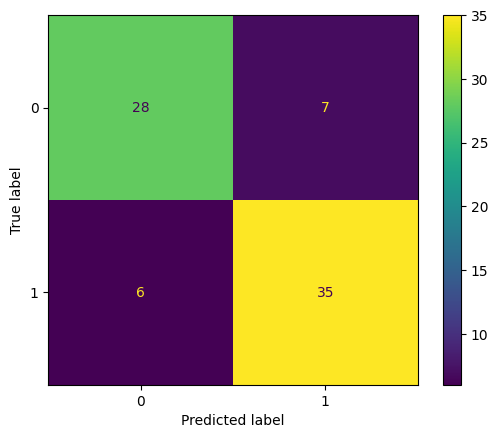

/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed whe

Modelo 1:
Parametros: {'n_estimators': 65, 'max_features': 'log2', 'max_depth': 1, 'criterion': 'entropy'}


/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed whe

Média do cross-validation do teste: 0.8283333333333334
Acurâcia do teste: 0.8552631578947368
Precisão do teste: 0.8260869565217391
Sensibilidade (recall) do teste: 0.926829268292683
F1-Score do teste: 0.8735632183908046



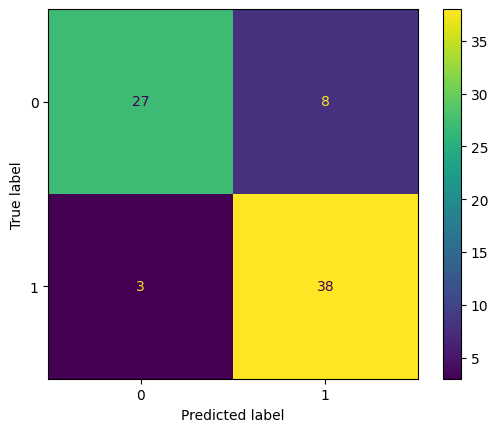

/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed whe

Modelo 2:
Parametros: {'n_estimators': 60, 'max_features': 'sqrt', 'max_depth': 10, 'criterion': 'entropy'}


/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed whe

Média do cross-validation do teste: 0.8416666666666668
Acurâcia do teste: 0.8421052631578947
Precisão do teste: 0.8372093023255814
Sensibilidade (recall) do teste: 0.8780487804878049
F1-Score do teste: 0.8571428571428572



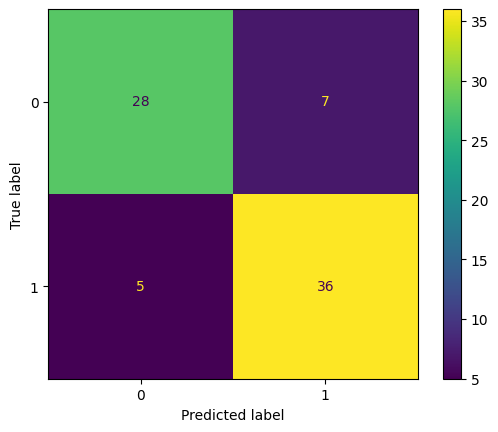

/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed whe

Modelo 3:
Parametros: {'n_estimators': 36, 'max_features': 'sqrt', 'max_depth': 6, 'criterion': 'gini'}


/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)


Média do cross-validation do teste: 0.8150000000000001
Acurâcia do teste: 0.8421052631578947
Precisão do teste: 0.8372093023255814
Sensibilidade (recall) do teste: 0.8780487804878049
F1-Score do teste: 0.8571428571428572



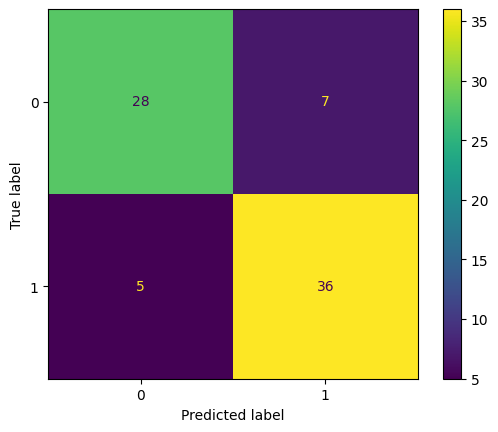

/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed whe

Modelo 4:
Parametros: {'n_estimators': 26, 'max_features': 'log2', 'max_depth': 5, 'criterion': 'log_loss'}


/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)


Média do cross-validation do teste: 0.8416666666666666
Acurâcia do teste: 0.8552631578947368
Precisão do teste: 0.8260869565217391
Sensibilidade (recall) do teste: 0.926829268292683
F1-Score do teste: 0.8735632183908046



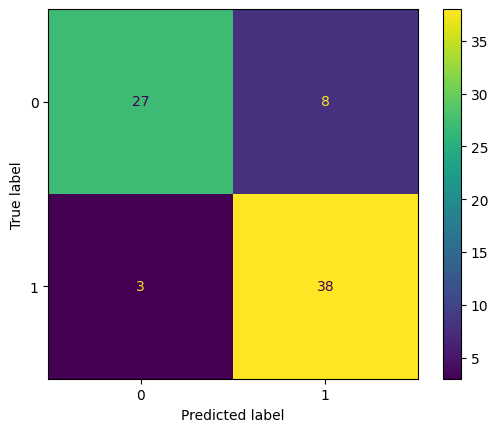

In [28]:
# Avaliando os melhores 5 modelos com auxílio de outras métricas
models = []
for i, params in enumerate(best5_models['params']):
    best_rf = RandomForestClassifier(**params)
    cross_val_score(best_rf, train_data, train_labels, cv=5)
    best_rf.fit(train_data, train_labels)
    labels_pred = best_rf.predict(test_data)
    models.append(best_rf)
    cm = confusion_matrix(test_labels, labels_pred)
    print(f"Modelo {i}:")
    print(f"Parametros: {params}")
    print(f"Média do cross-validation do teste: {np.mean(cross_val_score(best_rf, test_data, test_labels, cv=5))}")
    print(f"Acurâcia do teste: {accuracy_score(test_labels, labels_pred)}")
    print(f"Precisão do teste: {precision_score(test_labels, labels_pred, pos_label=1)}")
    print(f"Sensibilidade (recall) do teste: {recall_score(test_labels, labels_pred, pos_label=1)}")
    print(f"F1-Score do teste: {f1_score(test_labels, labels_pred, pos_label=1)}\n")
    ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=[0, 1]).plot()
    plt.show()

Com isso, percebe-se que o melhor modelo é o primeiro, modelo 0, logo iremos pegar o modelo 0 criado pelo RandomizedSearchCV, que possui os mesmos parâmetros, e iremos analisar ele usando essas mesmas métricas de avaliação.

In [29]:
best_rf = rand_search.best_estimator_

print(f"Os melhores parâmetros são: {rand_search.best_params_}")
print(f"Com a média do cross-validation do treinamento sendo {rand_search.best_score_}")

Os melhores parâmetros são: {'n_estimators': 25, 'max_features': 'sqrt', 'max_depth': 6, 'criterion': 'gini'}
Com a média do cross-validation do treinamento sendo 0.823768115942029


/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed whe

Média do cross-validation do teste: 0.8149999999999998
Acurâcia do teste: 0.8157894736842105
Precisão do teste: 0.813953488372093
Sensibilidade (recall) do teste: 0.8536585365853658
F1-Score do teste: 0.8333333333333333


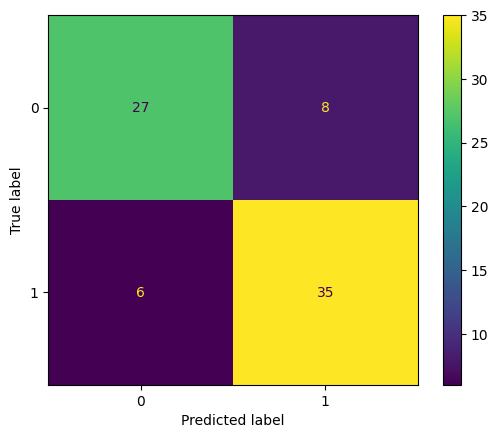

In [30]:
labels_pred = best_rf.predict(test_data)
cm = confusion_matrix(test_labels, labels_pred)
print(f"Média do cross-validation do teste: {np.mean(cross_val_score(best_rf, test_data, test_labels, cv=5))}")
print(f"Acurâcia do teste: {accuracy_score(test_labels, labels_pred)}")
print(f"Precisão do teste: {precision_score(test_labels, labels_pred, pos_label=1)}")
print(f"Sensibilidade (recall) do teste: {recall_score(test_labels, labels_pred, pos_label=1)}")
print(f"F1-Score do teste: {f1_score(test_labels, labels_pred, pos_label=1)}")
ConfusionMatrixDisplay(confusion_matrix=cm).plot()

# Random Forest com overfitting

No modelo abaixo é mostrada uma Random Forest com indícios de overfitting, visto que tanto a acurácia, a precisão e o recall foram menores no teste que no treinamento

<ipython-input-34-06e4e8d802a4>:2: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  rf.fit(train_data, train_labels)


Acurâcia do treino: 1.0
Acurâcia do teste: 0.8421052631578947


/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed whe

Média do cross-validation do treinamento: 0.8060869565217391


/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed whe

Média do cross-validation do teste: 0.8016666666666665
Precisão do treinamento: 1.0
Precisão do teste: 0.8372093023255814
Sensibilidade (recall) do treinamento: 1.0
Sensibilidade (recall) do teste: 0.8780487804878049
F1-Score do teste: 0.8571428571428572


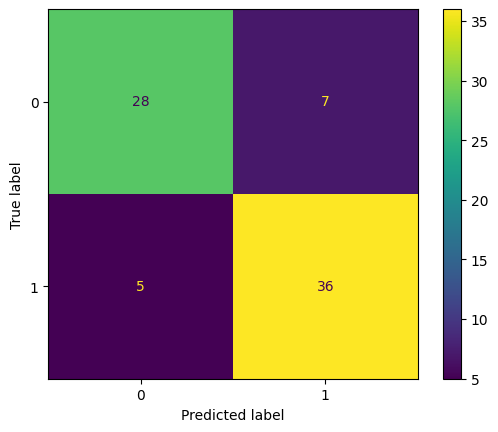

In [34]:
rf = RandomForestClassifier(n_estimators=1000, max_depth=1000, random_state=42)
rf.fit(train_data, train_labels)
labels_pred = rf.predict(test_data)
labels_pred_train = rf.predict(train_data)
cm = confusion_matrix(test_labels, labels_pred)
print(f"Acurâcia do treino: {accuracy_score(train_labels, labels_pred_train)}")
print(f"Acurâcia do teste: {accuracy_score(test_labels, labels_pred)}")
print(f"Média do cross-validation do treinamento: {np.mean(cross_val_score(best_rf, train_data, train_labels, cv=5))}")
print(f"Média do cross-validation do teste: {np.mean(cross_val_score(best_rf, test_data, test_labels, cv=5))}")
print(f"Precisão do treinamento: {precision_score(train_labels, labels_pred_train, pos_label=1)}")
print(f"Precisão do teste: {precision_score(test_labels, labels_pred, pos_label=1)}")
print(f"Sensibilidade (recall) do treinamento: {recall_score(train_labels, labels_pred_train, pos_label=1)}")
print(f"Sensibilidade (recall) do teste: {recall_score(test_labels, labels_pred, pos_label=1)}")
print(f"F1-Score do teste: {f1_score(test_labels, labels_pred, pos_label=1)}")
ConfusionMatrixDisplay(confusion_matrix=cm).plot()

# Random Forest



Árvores geradas pelo RandomizedSearch

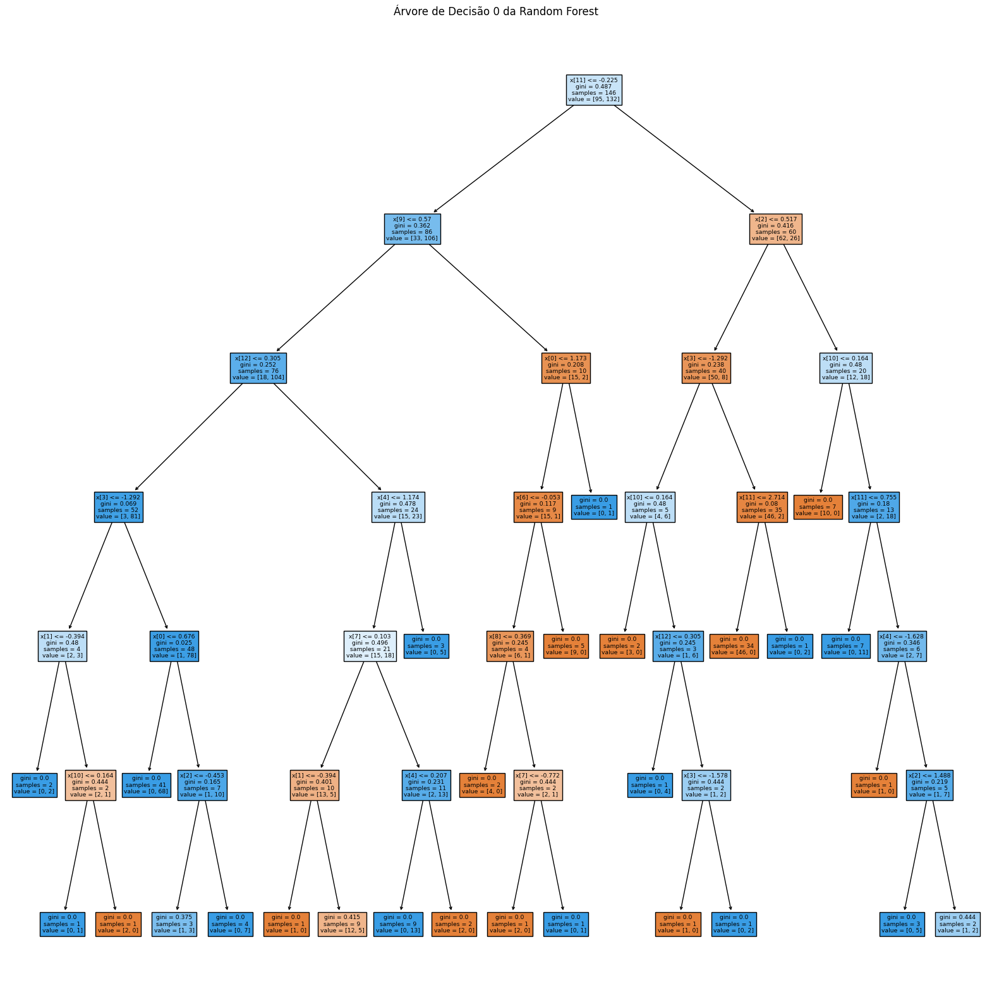

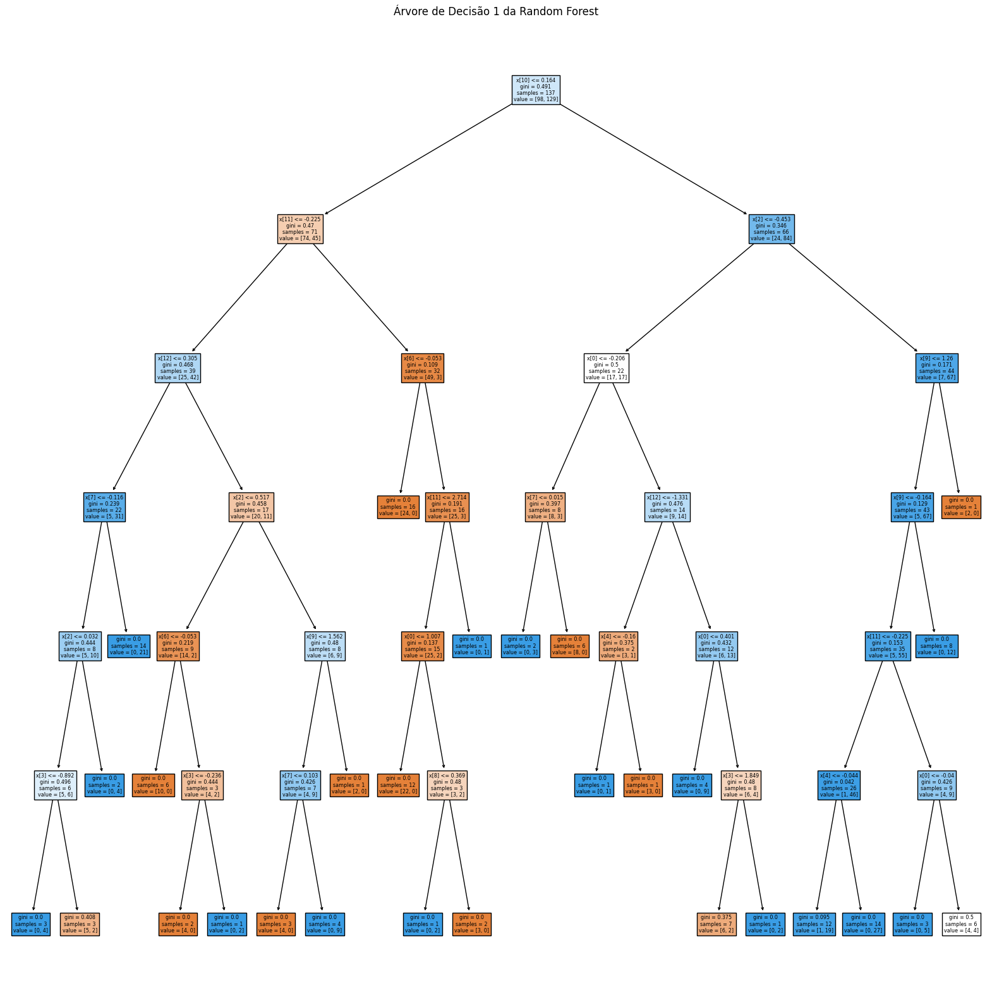

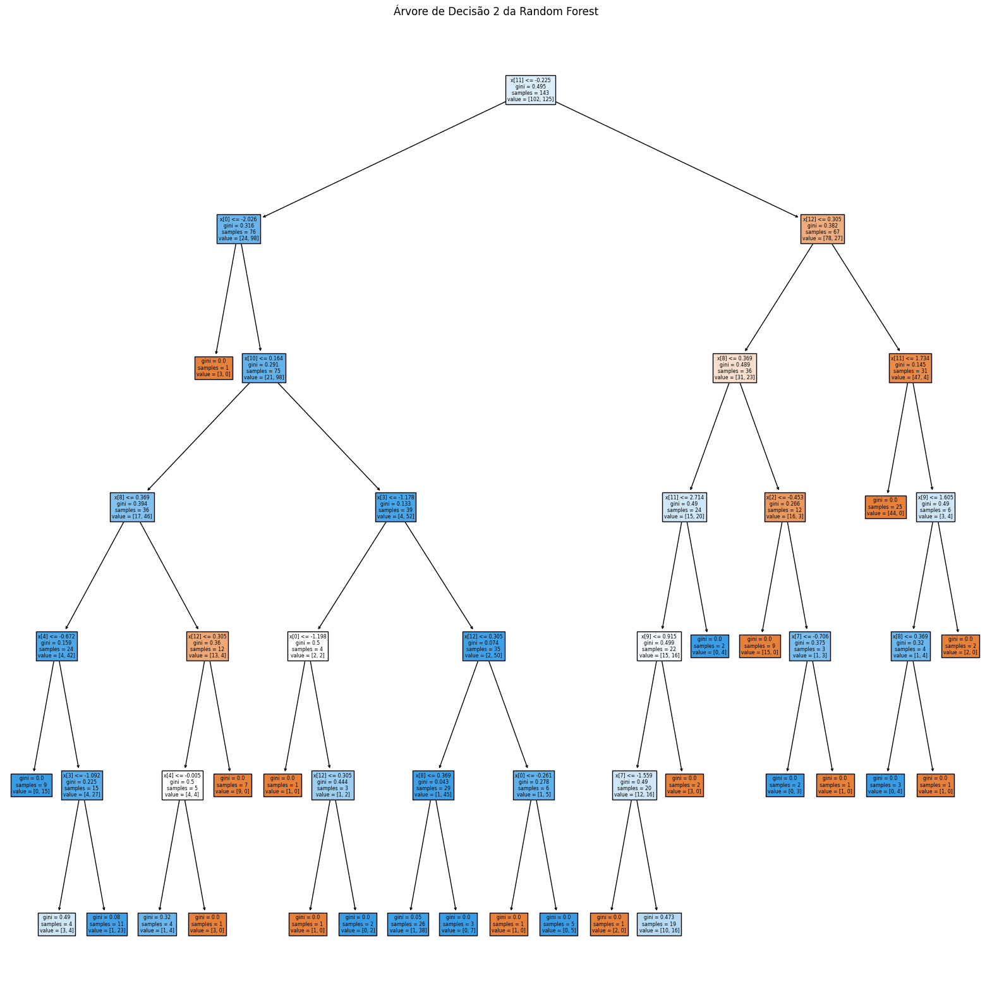

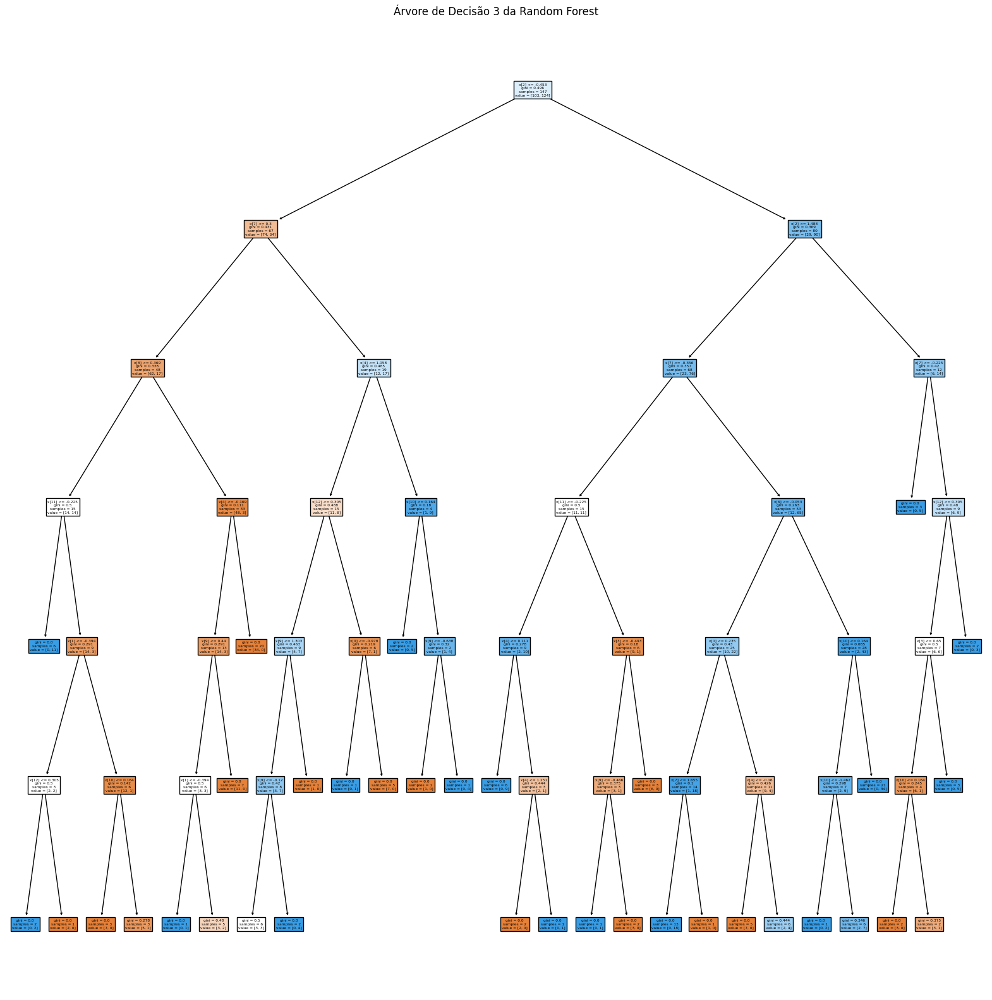

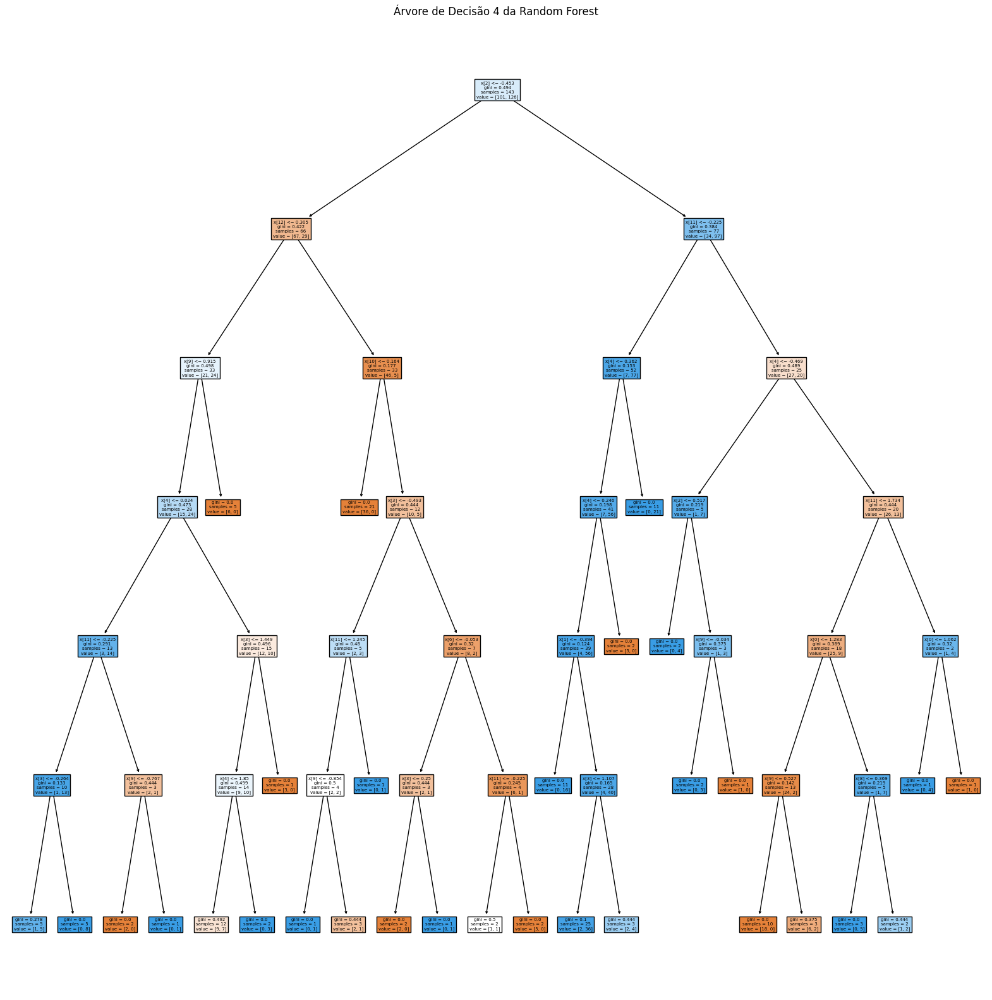

...

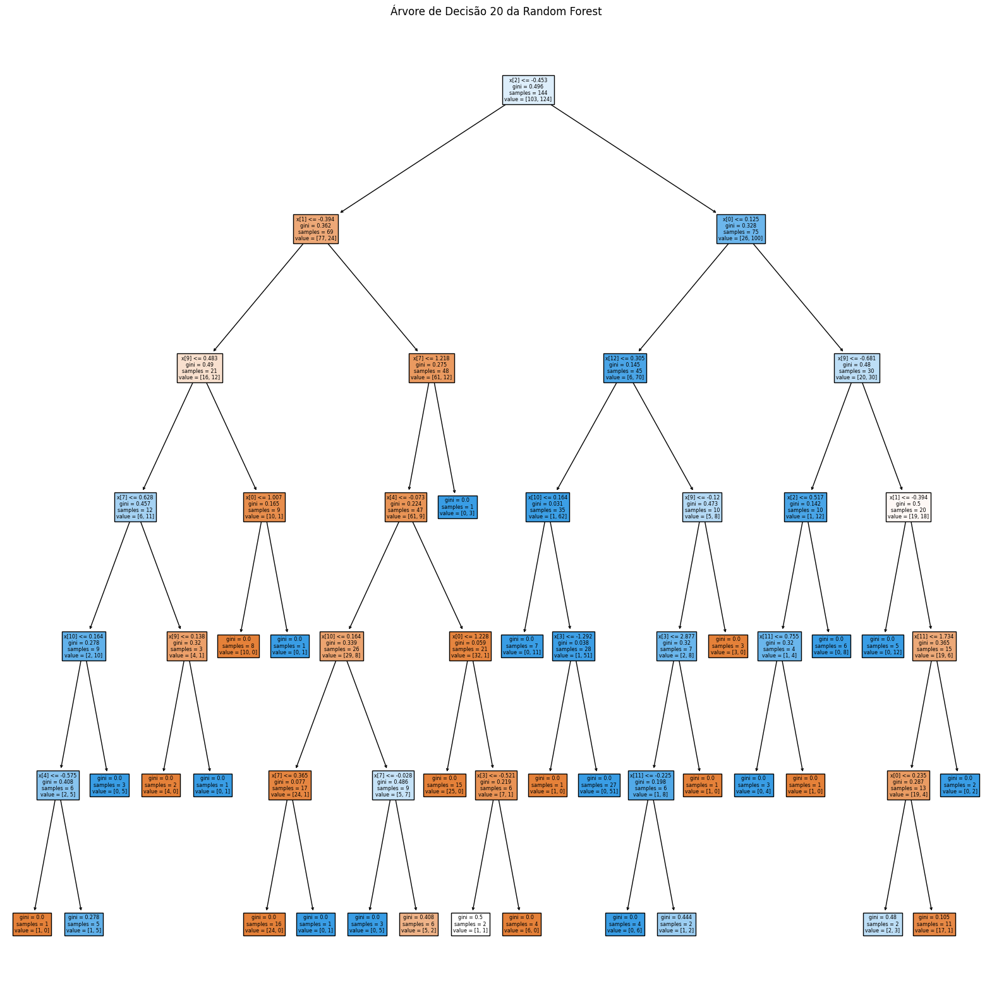

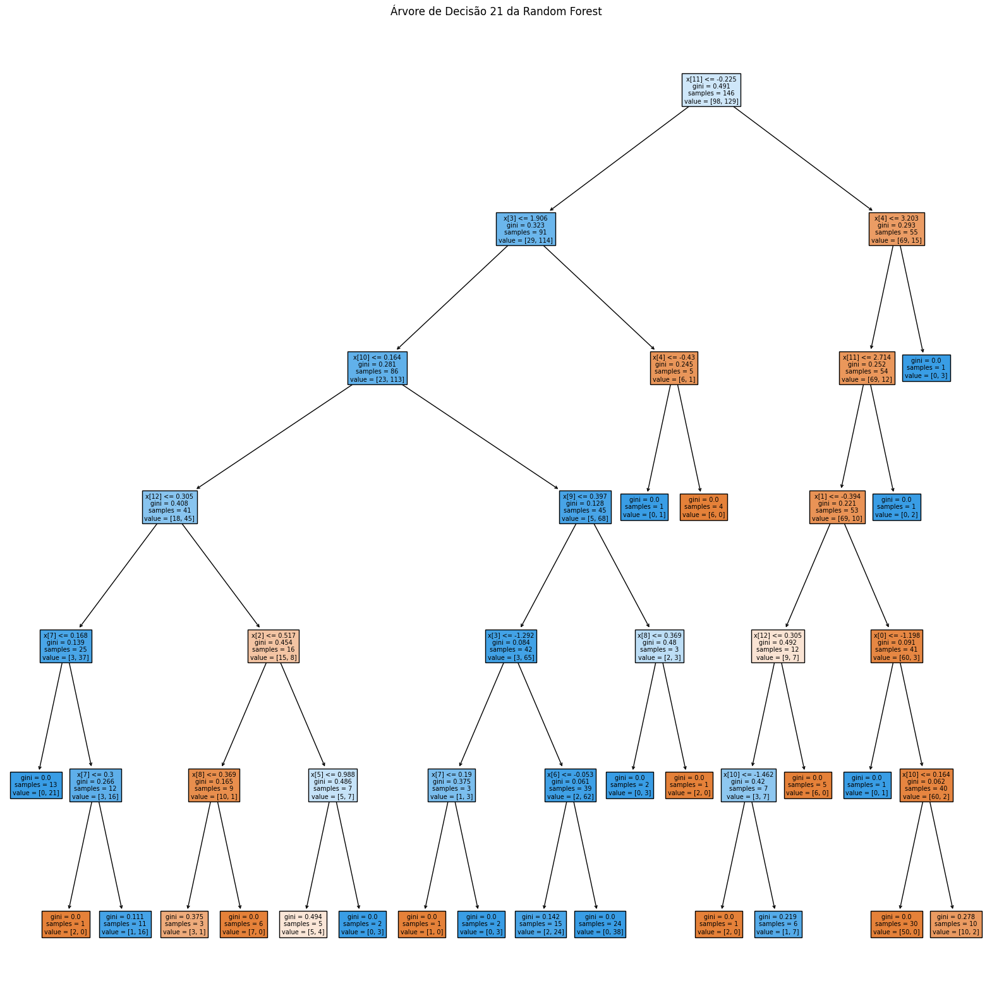

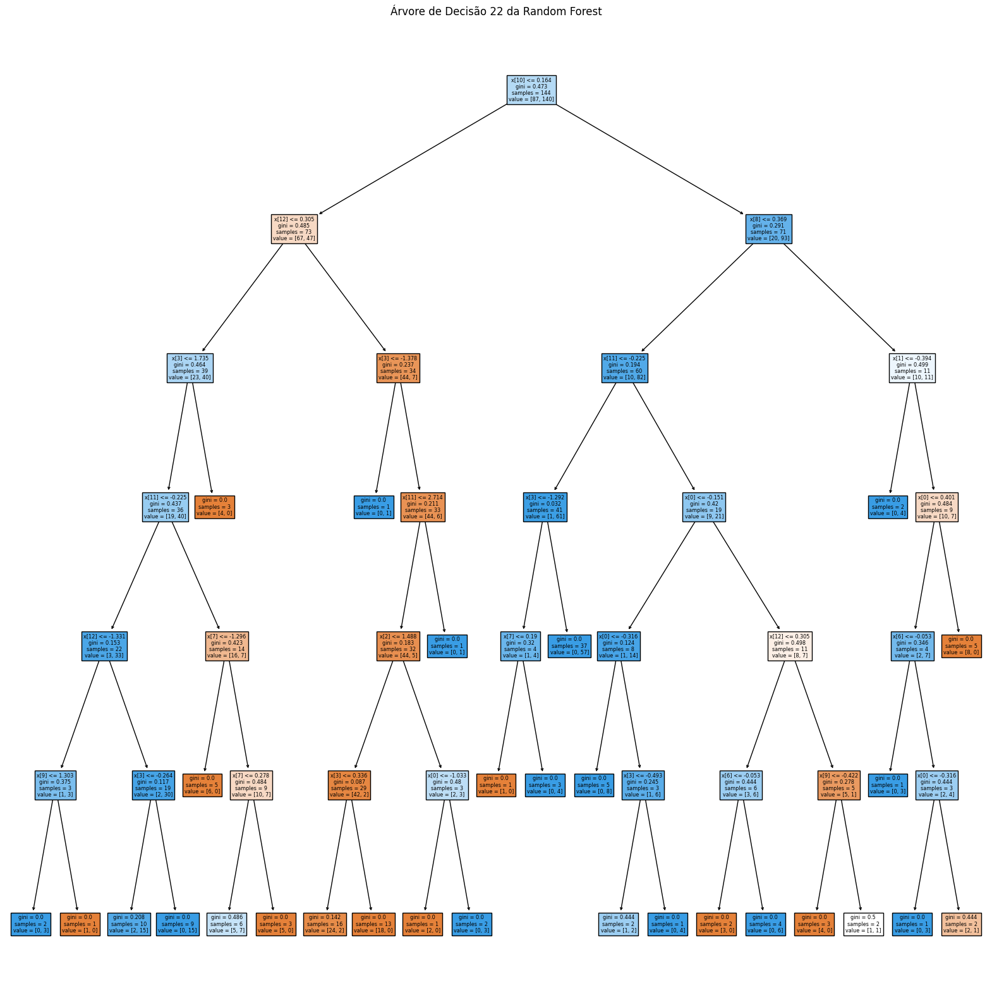

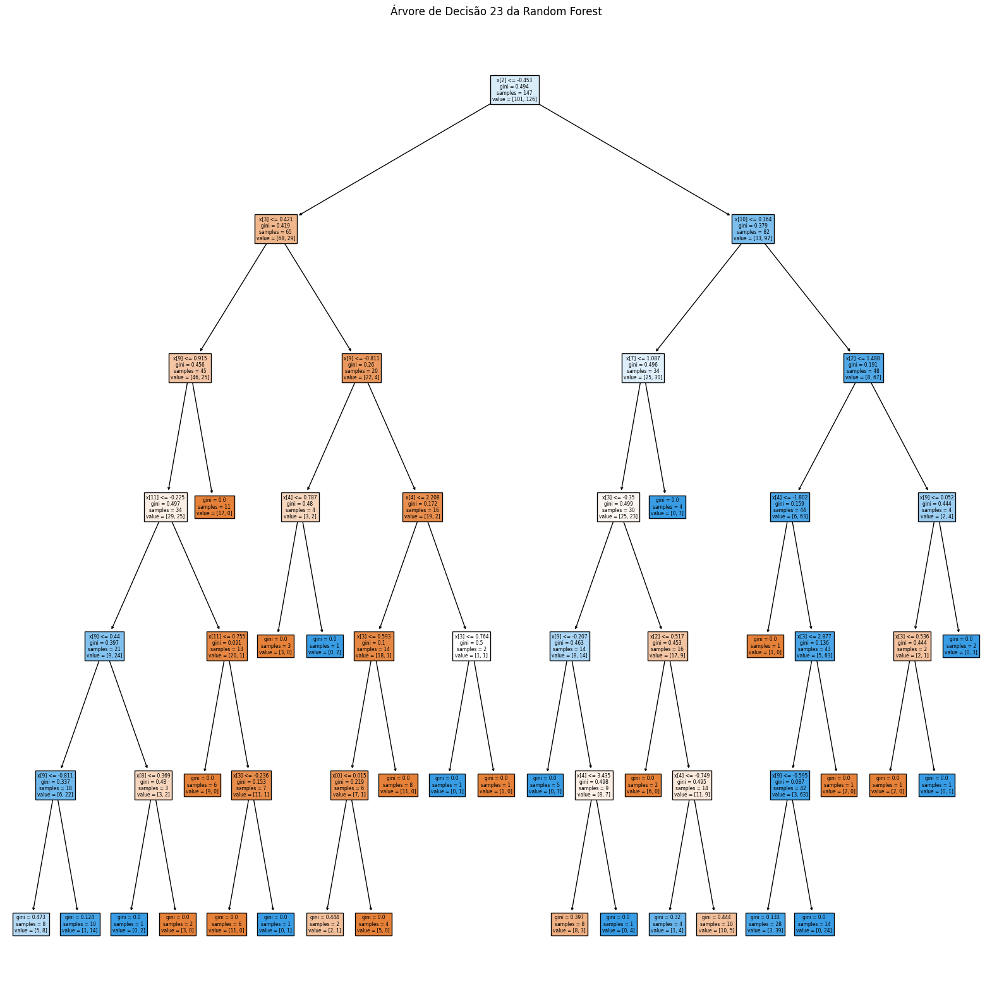

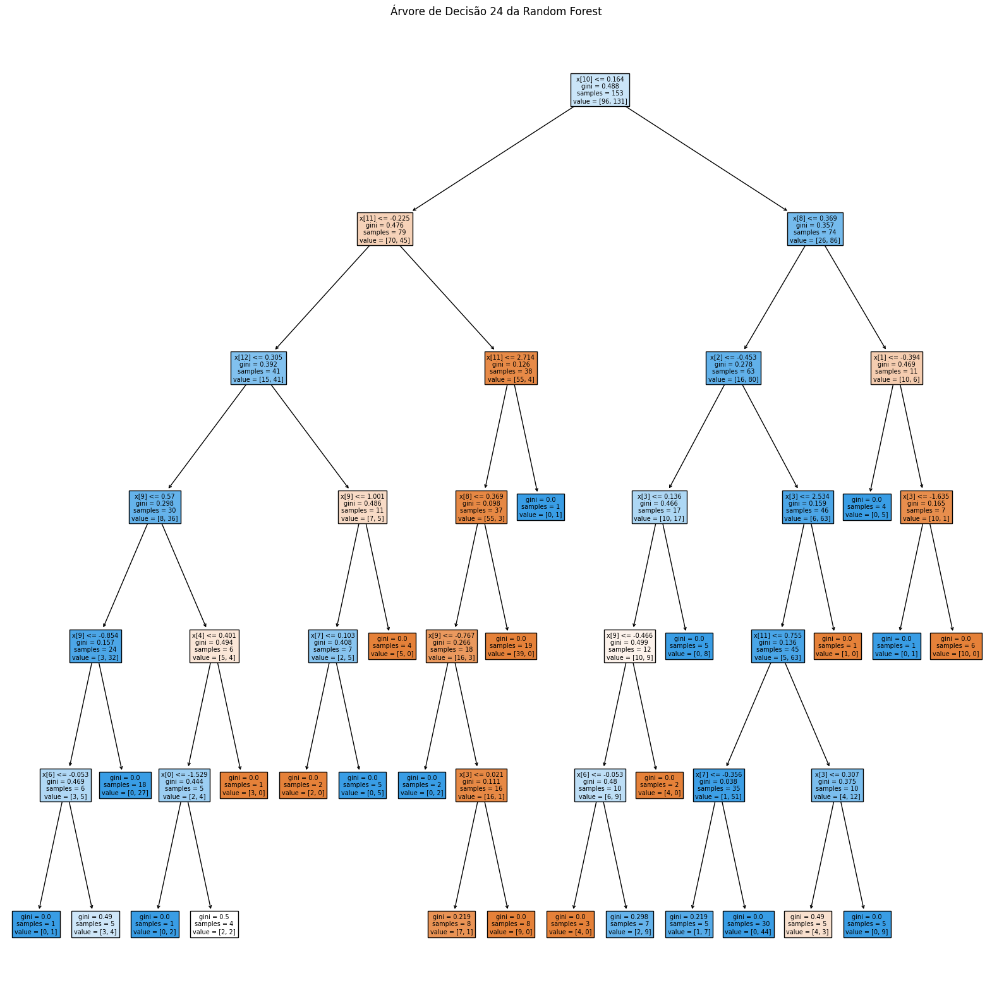

In [33]:
for i, tree in enumerate(best_rf):
    plt.figure(figsize=(20,20))
    plot_tree(tree, filled=True)
    plt.title(f"Árvore de Decisão {i} da Random Forest")
    plt.show()

Árvores que compõem o Modelo 0 criado manualmente

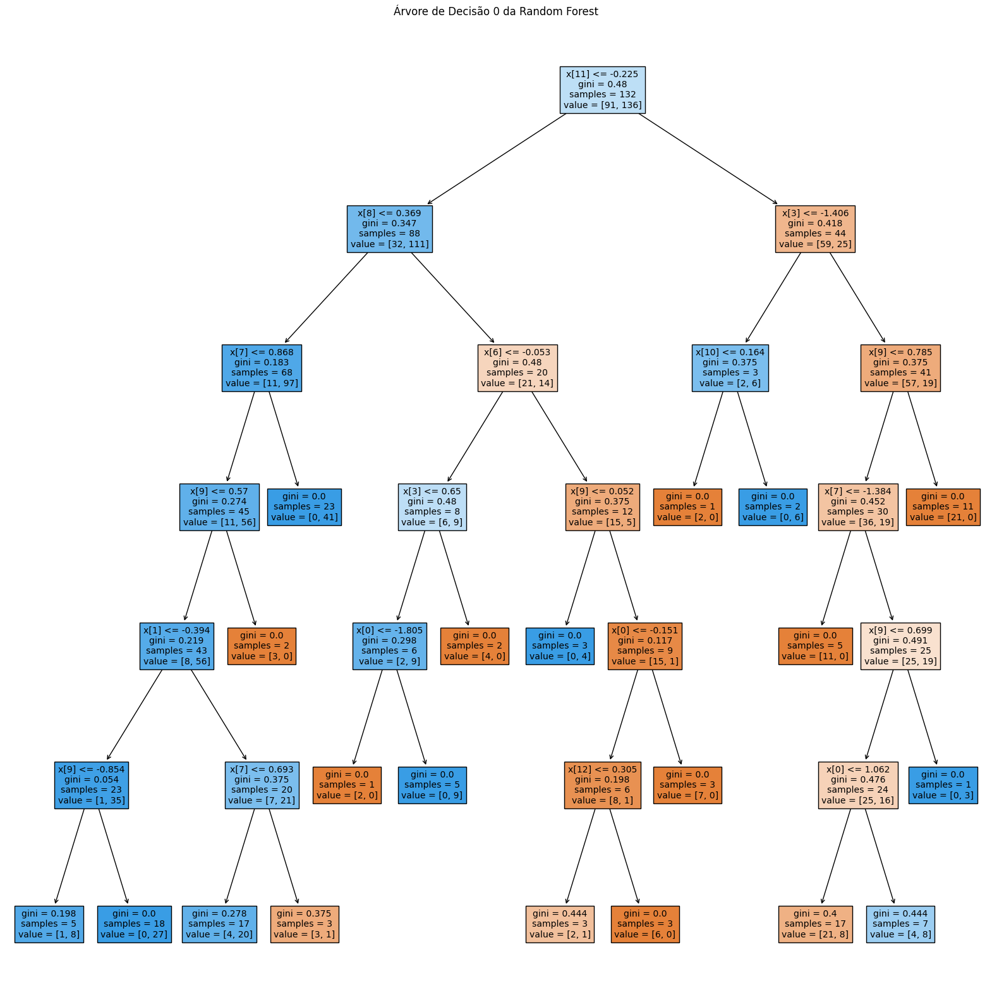

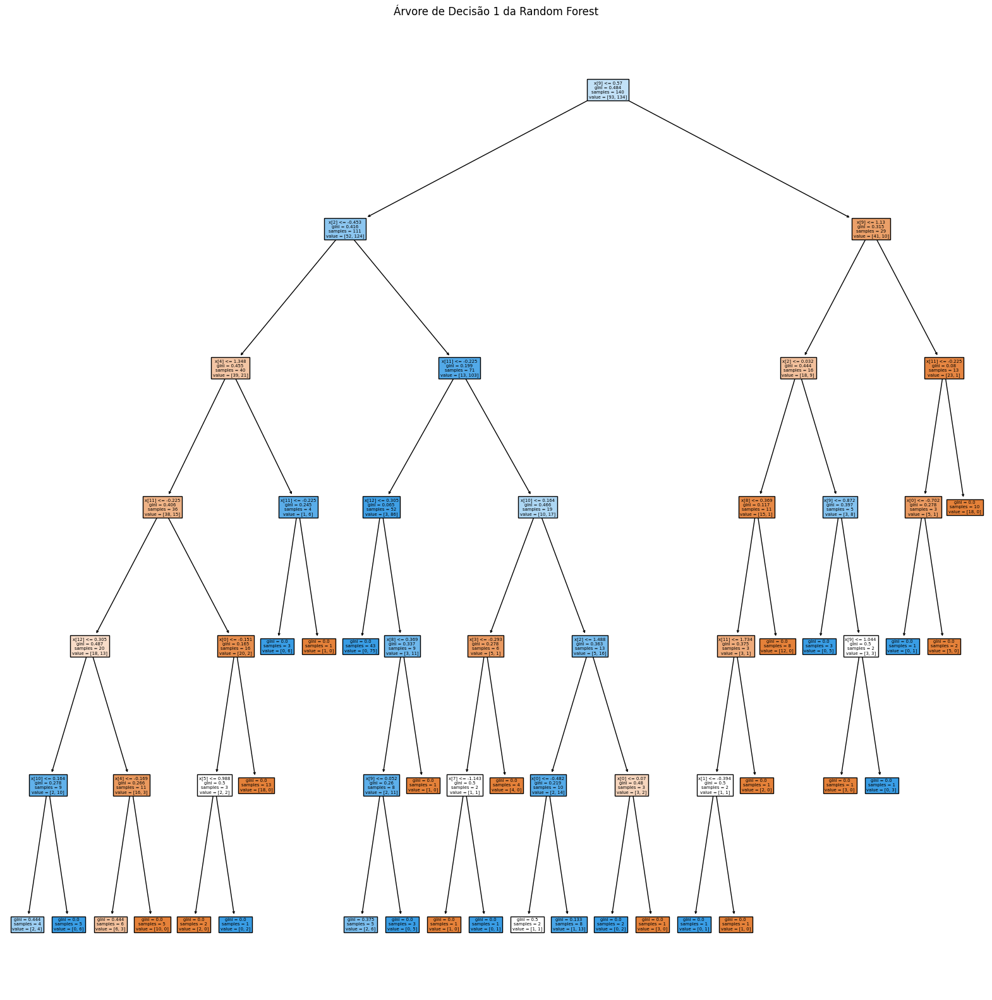

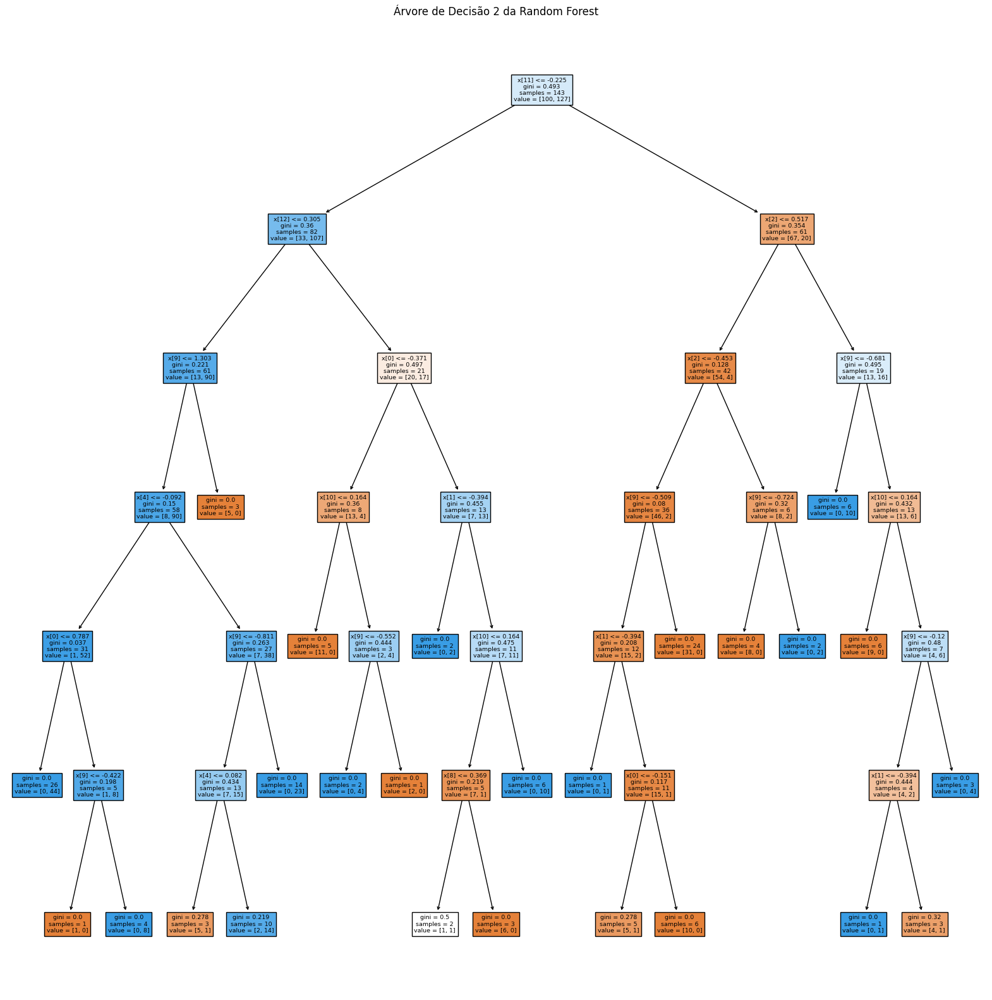

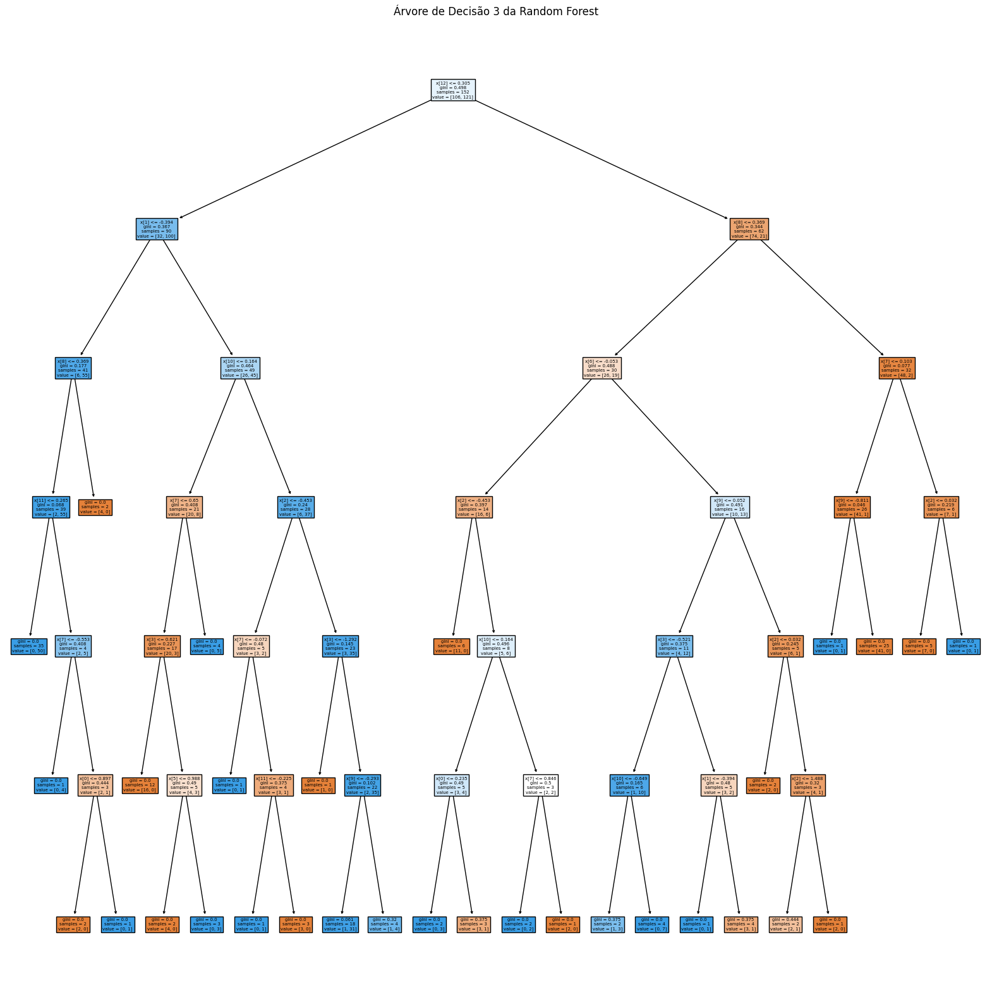

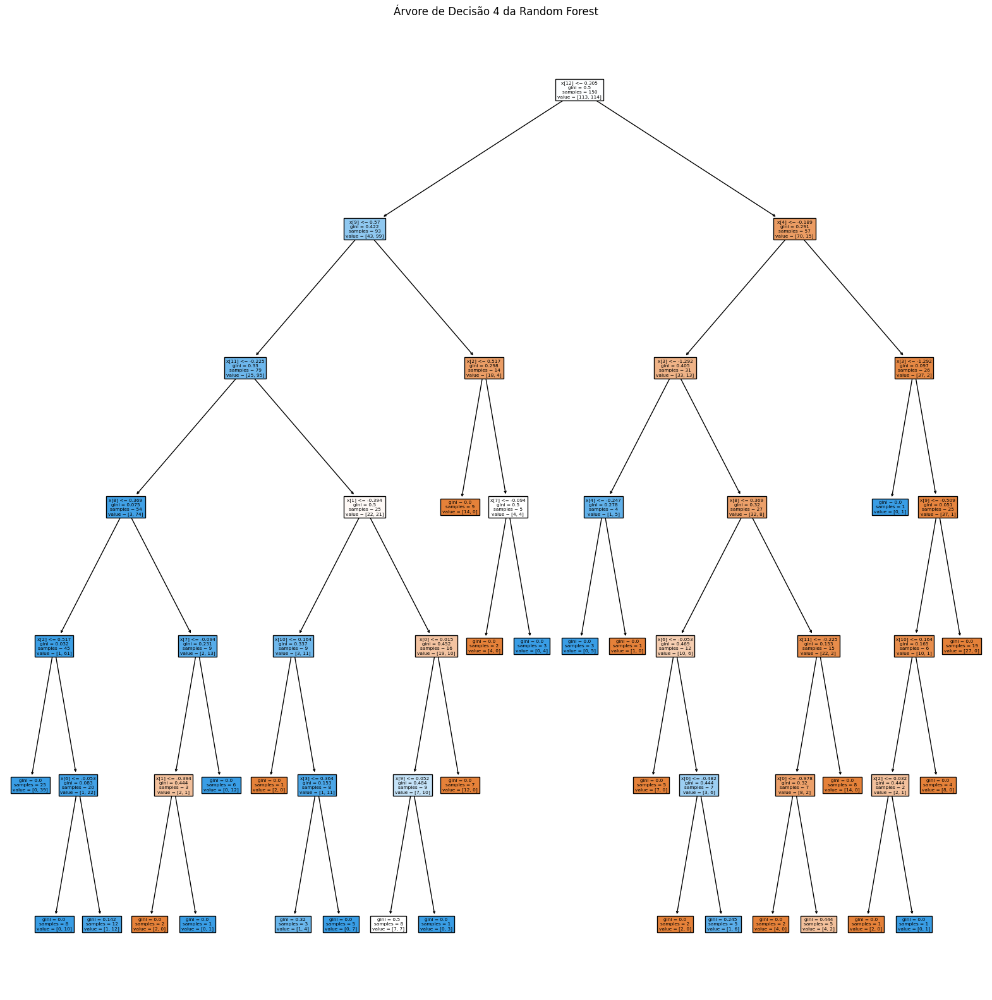

...

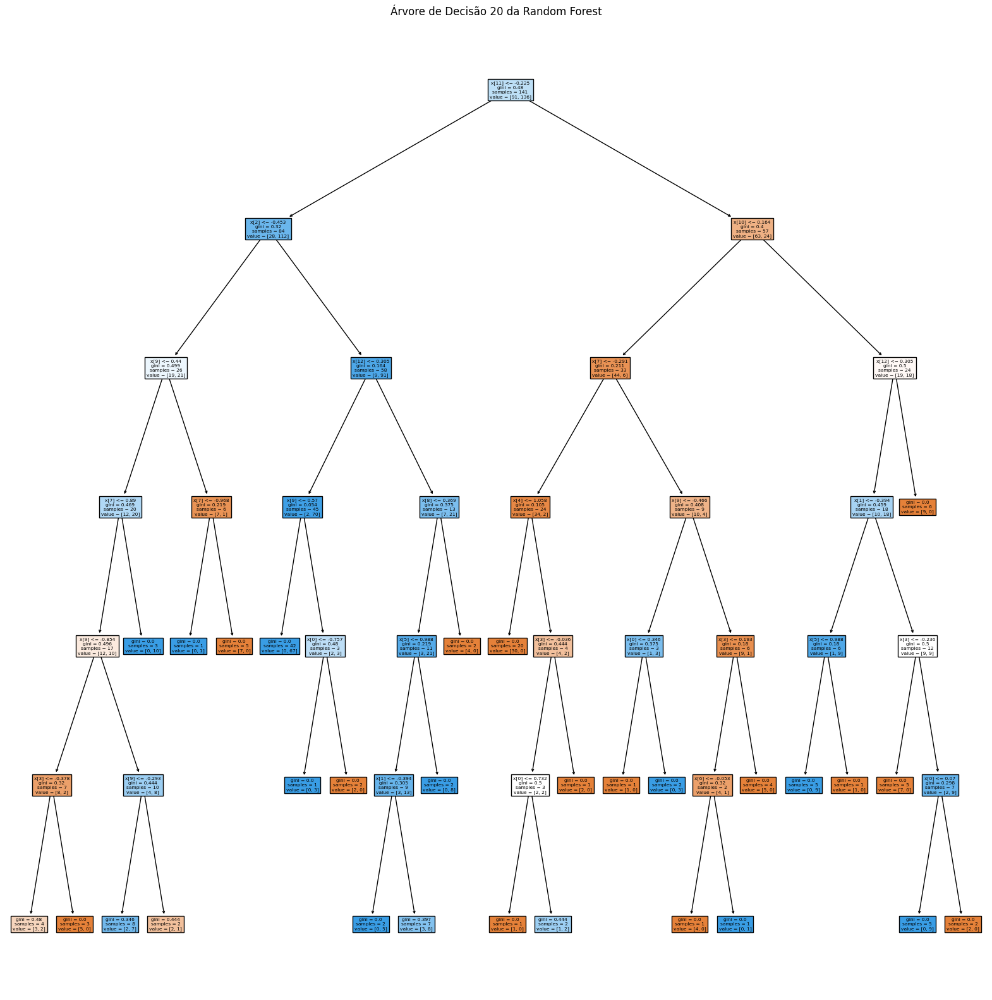

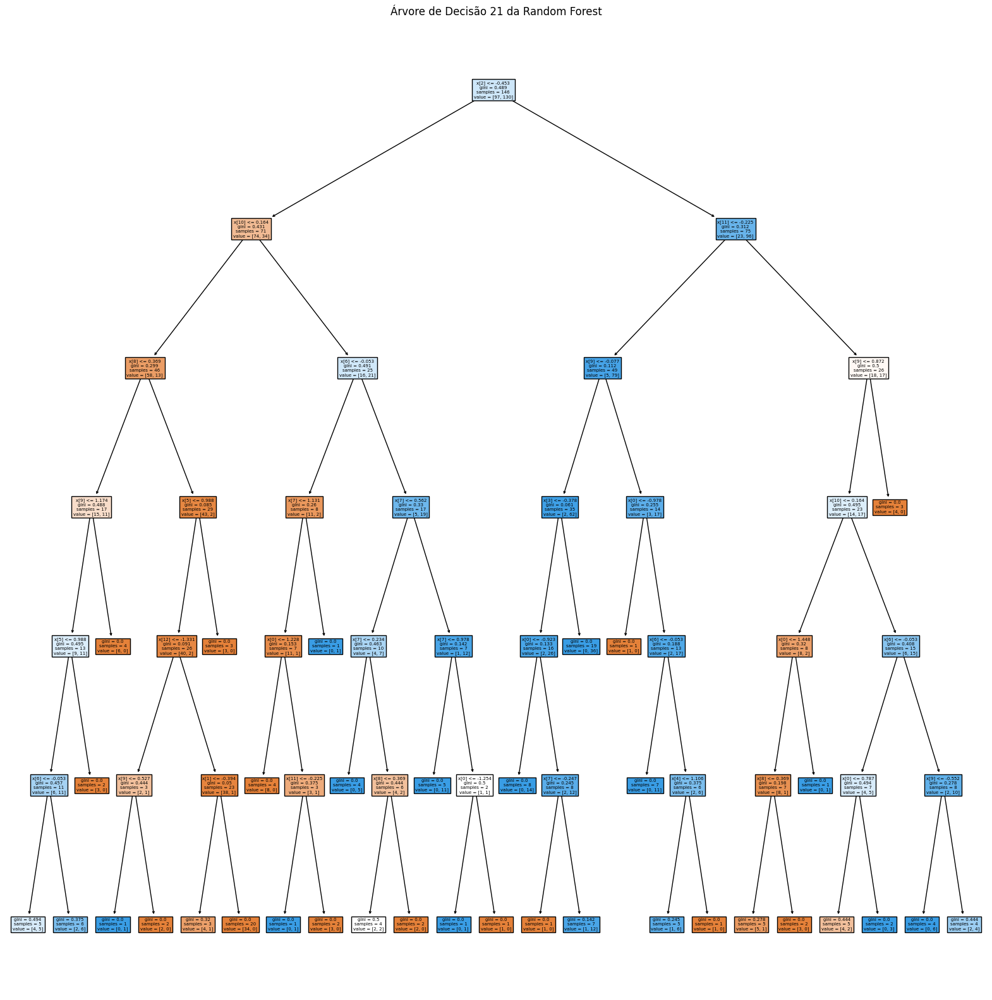

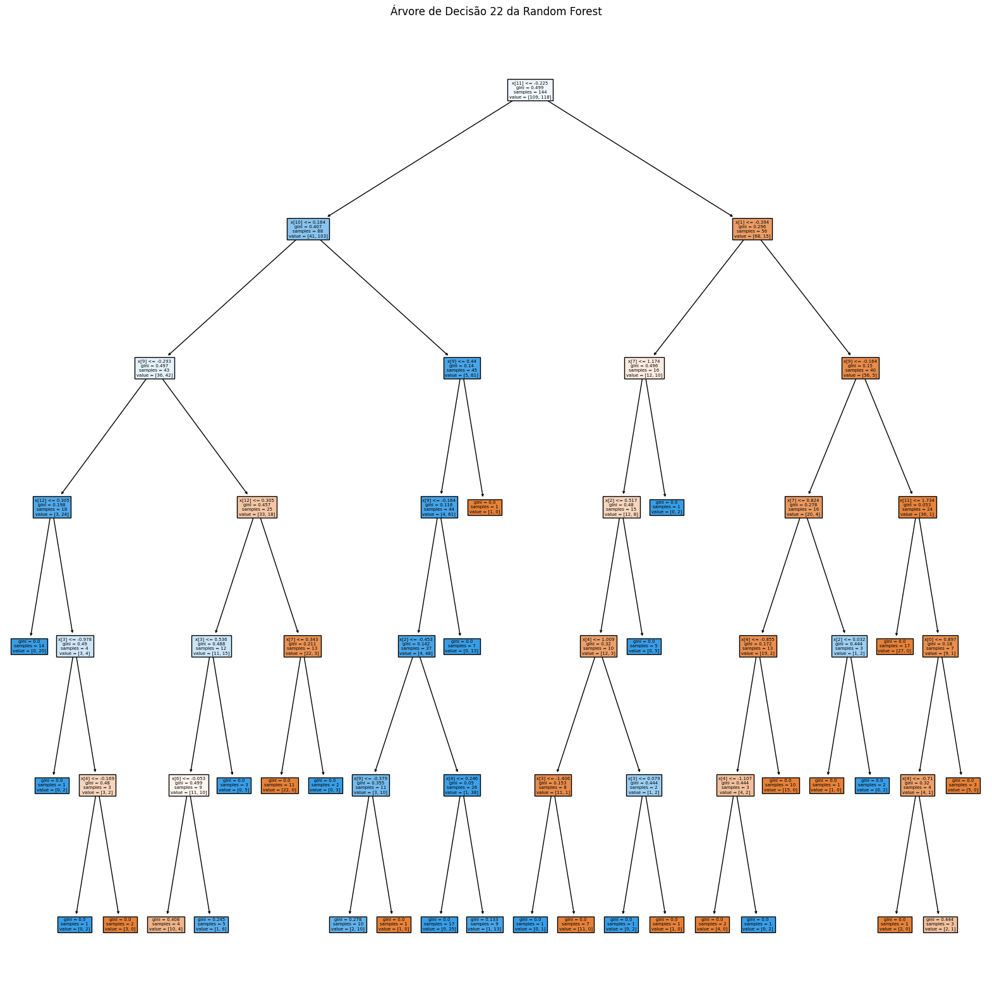

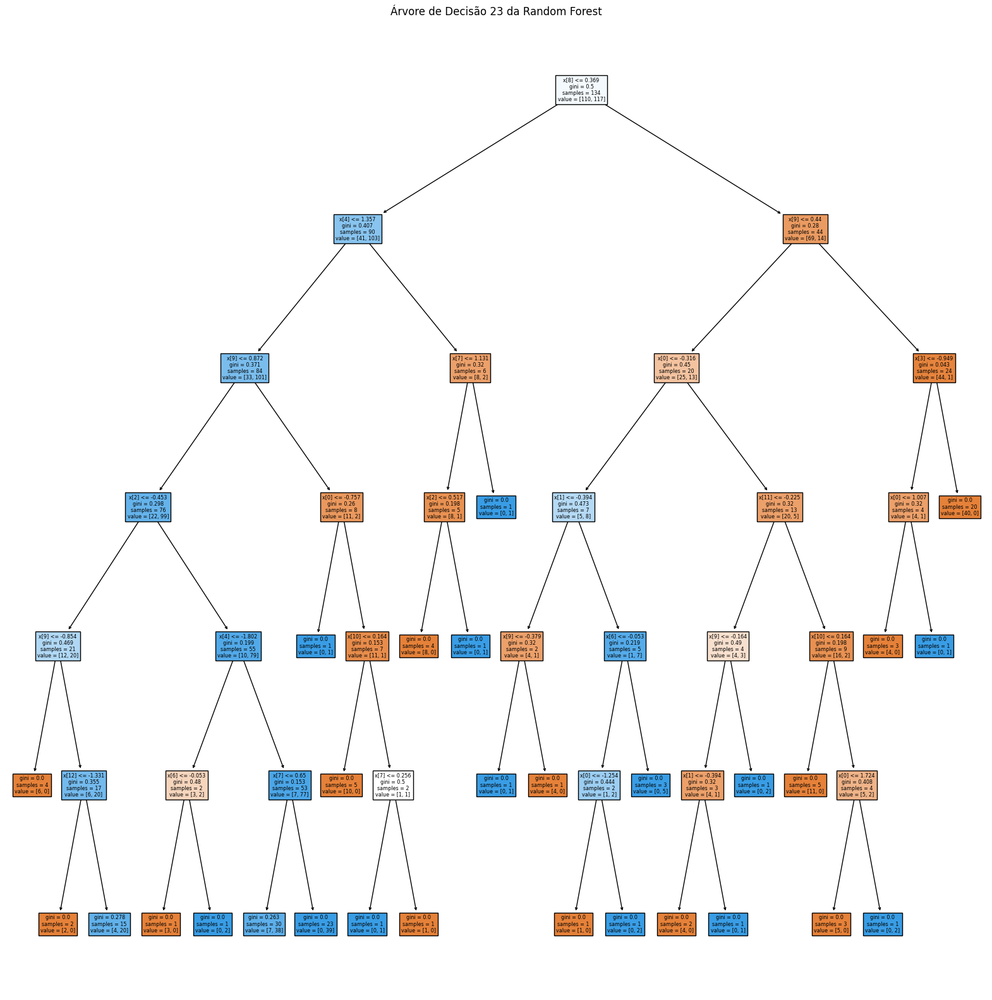

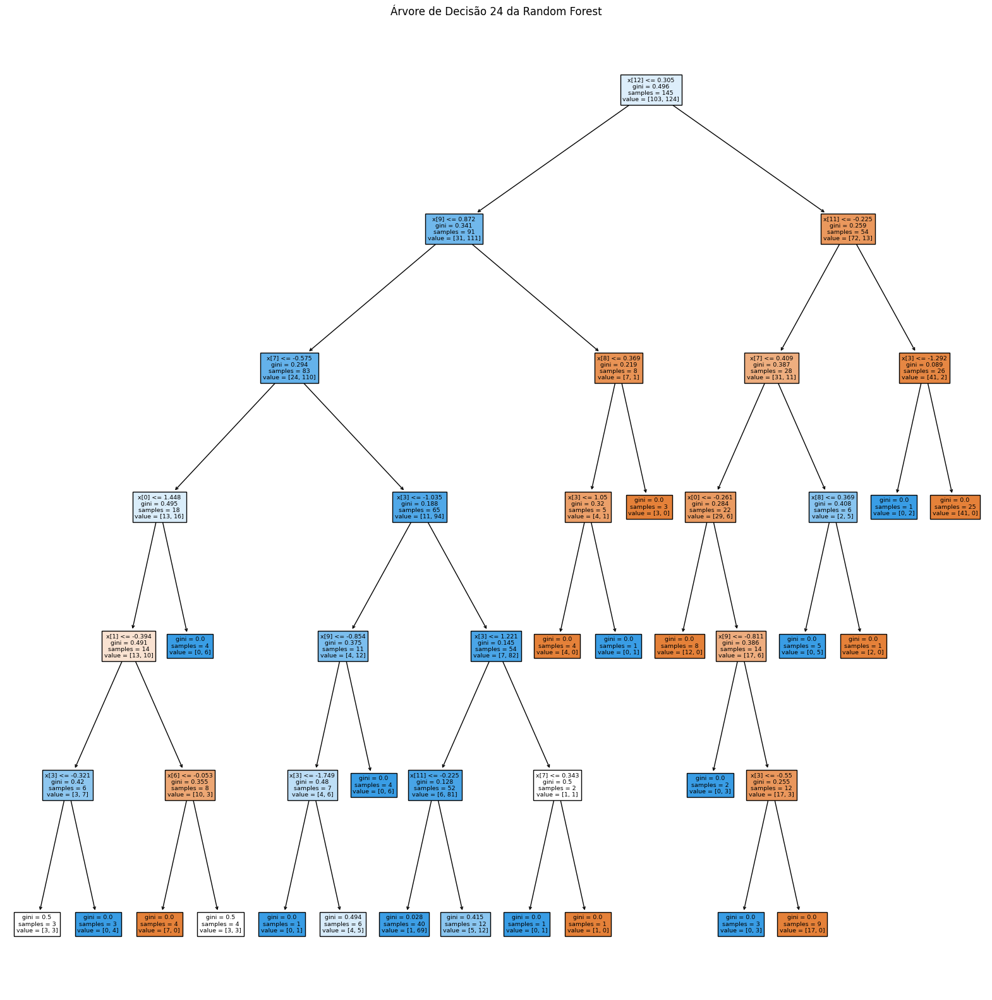

In [32]:
for i, tree in enumerate(models[0]):
    plt.figure(figsize=(20,20))
    plot_tree(tree, filled=True)
    plt.title(f"Árvore de Decisão {i} da Random Forest")
    plt.show()